<a href="https://colab.research.google.com/github/SamiHaddouti/ML-Project-Melbourne-House-Prediction/blob/main/DataExploration_Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Data Exploration Project - Demo**

# *Exploring Melbourne house market and building machine learning model for predictions*
![Melbourne View](https://drive.google.com/uc?export=view&id=1fvceZ0nvmACLgS0iqT7FgUTBNjqwpvZ-)
Source: https://www.realestate.com.au/news/housing-affordability-tipped-to-improve-in-melbourne-this-year/ 

# Install and import dependencies


In [1]:
!pip install mlflow
!pip install pickle5
!pip install pyyaml==5.4.1

     |████████████████████████████████| 16.5 MB 165 kB/s 
     |████████████████████████████████| 210 kB 48.8 MB/s 
     |████████████████████████████████| 79 kB 8.6 MB/s 
     |████████████████████████████████| 181 kB 52.8 MB/s 
     |████████████████████████████████| 62 kB 764 kB/s 
     |████████████████████████████████| 596 kB 47.3 MB/s 
     |████████████████████████████████| 146 kB 53.3 MB/s 
     |████████████████████████████████| 54 kB 2.5 MB/s 
     |████████████████████████████████| 63 kB 1.8 MB/s 
     |████████████████████████████████| 78 kB 6.9 MB/s 
  Created wheel for databricks-cli: filename=databricks_cli-0.16.6-py3-none-any.whl size=112631 sha256=db4f42253e9dc2fe54ec747cfe70da161bdf4af47d17d5166c97adc73c7aaa64
  Stored in directory: /root/.cache/pip/wheels/96/c1/f8/d75a22e789ab6a4dff11f18338c3af4360189aa371295cc934
Successfully built databricks-cli
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfu

In [2]:
#@title
import json
from urllib.request import urlopen
import random
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sb
import plotly.express as px
import mlflow
import mlflow.sklearn
from sklearn import tree
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import learning_curve
import pickle5 as pickle

/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


# Load data and set global variables

In [3]:
#@title
# Load data and set mapbox token
runs_df = pd.read_csv('https://raw.githubusercontent.com/SamiHaddouti/ML-Project-Melbourne-House-Prediction/main/data/output/runs.csv')
melb_df = pd.read_csv('https://raw.githubusercontent.com/SamiHaddouti/ML-Project-Melbourne-House-Prediction/main/data/input/melb_data.csv')
final_df = pd.read_csv('https://raw.githubusercontent.com/SamiHaddouti/ML-Project-Melbourne-House-Prediction/main/data/output/final_df.csv')
X_train = pd.read_csv('https://raw.githubusercontent.com/SamiHaddouti/ML-Project-Melbourne-House-Prediction/main/data/output/X_train.csv')
y_train = pd.read_csv('https://raw.githubusercontent.com/SamiHaddouti/ML-Project-Melbourne-House-Prediction/main/data/output/y_train.csv').values.ravel()
X_val = pd.read_csv('https://raw.githubusercontent.com/SamiHaddouti/ML-Project-Melbourne-House-Prediction/main/data/output/X_val.csv')
y_val = pd.read_csv('https://raw.githubusercontent.com/SamiHaddouti/ML-Project-Melbourne-House-Prediction/main/data/output/y_val.csv').values.ravel()
X_test = pd.read_csv('https://raw.githubusercontent.com/SamiHaddouti/ML-Project-Melbourne-House-Prediction/main/data/output/X_test.csv')
y_test = pd.read_csv('https://raw.githubusercontent.com/SamiHaddouti/ML-Project-Melbourne-House-Prediction/main/data/output/y_test.csv').values.ravel()

mapbox_pub_token = 'pk.eyJ1IjoibWFyZXRoeXUiLCJhIjoiY2ttbjdmdzVsMDVvdjJxb2N3Njg0OHFpdiJ9.zqh3ey7Ux-yAfA-fJJPADA'

In [4]:
#@title
# Get mlrun model and unzip it
!wget https://github.com/SamiHaddouti/ML-Project-Melbourne-House-Prediction/raw/main/mlruns.zip
!unzip /content/mlruns.zip

# Get GeoJSON
# Original link to GeoJSON:
#with urlopen('https://data.gov.au/geoserver/vic-suburb-locality-boundaries-psma-administrative-boundaries/wfs?request=GetFeature&typeName=ckan_af33dd8c_0534_4e18_9245_fc64440f742e&outputFormat=json') as response:
#    suburbs = json.load(response)
!wget https://github.com/SamiHaddouti/ML-Project-Melbourne-House-Prediction/raw/main/data/input/Victoria_suburb_geoJSON.json.zip
!unzip /content/Victoria_suburb_geoJSON.json.zip

--2022-04-07 20:59:43--  https://github.com/SamiHaddouti/ML-Project-Melbourne-House-Prediction/raw/main/mlruns.zip
Resolving github.com (github.com)... 13.114.40.48
Connecting to github.com (github.com)|13.114.40.48|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/SamiHaddouti/ML-Project-Melbourne-House-Prediction/main/mlruns.zip [following]
--2022-04-07 20:59:43--  https://raw.githubusercontent.com/SamiHaddouti/ML-Project-Melbourne-House-Prediction/main/mlruns.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 58165487 (55M) [application/zip]
Saving to: ‘mlruns.zip’

mlruns.zip          100%[===================>]  55.47M   115MB/s    in 0.5s    

2022-04-07 20:59:47 (115 MB/s) - ‘mlruns.zip’ s

## Helper functions

In [5]:
#@title
# Evaluate metrics of model 
def eval_model(y_val, y_pred):
    mae = mean_absolute_error(y_val, y_pred)
    mse = mean_squared_error(y_val, y_pred)
    rmse = np.sqrt(mean_squared_error(y_val, y_pred))
    r2 = r2_score(y_val, y_pred)

    metrics = {
        "mae" : mae,
        "mse" : mse,
        "rmse" : rmse,
        "r2" : r2
        }

    return metrics
  
# Calculate how close a feature value is compared to the mean of the feature
def calc_prob(row):
  b_area_compared = round((row['BuildingArea'] / final_df['BuildingArea'].mean() - 1) * 100)
  distance_compared = round(row['Distance'] - final_df['Distance'].mean(), 1) 
  rooms_compared = round(row['Rooms'] - round(final_df['Rooms'].mean()))
  return [b_area_compared, distance_compared, rooms_compared]

# Helper function to support print statements (e.g. check for positive/negative values)
def check_pos_neg(number, option):
  if number == 0:
    return ', therefore, same as'
  elif number > 0:
    if option == 0:
      return ' above'
    else:
      return ' higher than'
  else:
    if option == 0:
      return ' below'
    else:
      return ' lower than'

# **Data Exploration**

# General overview

In [6]:
#@title
melb_df.info()
melb_df.describe()
melb_df.isna().sum()
melb_df.describe().transpose().apply(lambda s: s.apply('{0:.5f}'.format))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         13580 non-null  object 
 1   Address        13580 non-null  object 
 2   Rooms          13580 non-null  int64  
 3   Type           13580 non-null  object 
 4   Price          13580 non-null  float64
 5   Method         13580 non-null  object 
 6   SellerG        13580 non-null  object 
 7   Date           13580 non-null  object 
 8   Distance       13580 non-null  float64
 9   Postcode       13580 non-null  float64
 10  Bedroom2       13580 non-null  float64
 11  Bathroom       13580 non-null  float64
 12  Car            13518 non-null  float64
 13  Landsize       13580 non-null  float64
 14  BuildingArea   7130 non-null   float64
 15  YearBuilt      8205 non-null   float64
 16  CouncilArea    12211 non-null  object 
 17  Lattitude      13580 non-null  float64
 18  Longti

,count,mean,std,min,25%,50%,75%,max
Rooms,13580.00000,2.93800,0.95575,1.00000,2.00000,3.00000,3.00000,10.00000
Price,13580.00000,1075684.07946,639310.72430,85000.00000,650000.00000,903000.00000,1330000.00000,9000000.00000
Distance,13580.00000,10.13778,5.86872,0.00000,6.10000,9.20000,13.00000,48.10000
Postcode,13580.00000,3105.30191,90.67696,3000.00000,3044.00000,3084.00000,3148.00000,3977.00000
Bedroom2,13580.00000,2.91473,0.96592,0.00000,2.00000,3.00000,3.00000,20.00000
Bathroom,13580.00000,1.53424,0.69171,0.00000,1.00000,1.00000,2.00000,8.00000
Car,13518.00000,1.61008,0.96263,0.00000,1.00000,2.00000,2.00000,10.00000
Landsize,13580.00000,558.41613,3990.66924,0.00000,177.00000,440.00000,651.00000,433014.00000
BuildingArea,7130.00000,151.96765,541.01454,0.00000,93.00000,126.00000,174.00000,44515.00000
YearBuilt,8205.00000,1964.68422,37.27376,1196.00000,1940.00000,1970.00000,1999.00000,2018.00000


# Distribution plots

In [7]:
#@title
# Explore BuildingArea as it has many missing values

fig = px.histogram(melb_df['BuildingArea'])
fig.update_layout(
    title_text='Building area distribution',
    font=dict(
            family="Times New Roman"
        ),
    xaxis=dict(
        title='Building area'),
    yaxis=dict(
        title='Count'),
    showlegend=False
)

Building area has extreme outliers, which is why they were removed for training the model.

# Distribution of suburb mean prices

In [8]:
#@title
# Numerialize Suburbs by dividing in 3 classes
suburb_mean_price = melb_df.groupby('Suburb')['Price'].mean()

# Add/map mean suburb prices to suburbs in df
melb_df['suburb_mean_price'] = melb_df['Suburb'].map(suburb_mean_price)

one_third_quantile = suburb_mean_price.quantile(0.33)
two_third_quantile = suburb_mean_price.quantile(0.66)

fig = px.histogram(suburb_mean_price)
fig.update_layout(
    title_text='Mean price distribution among suburbs',
    font=dict(
            family="Times New Roman"
        ),
    xaxis=dict(
        title='Price'),
    yaxis=dict(
        title='Count'),
    showlegend=False
)
fig.add_vline(x=one_third_quantile, line_width=2, 
              line_dash="dash", line_color="green", 
              annotation_text="33% Quantile", 
              annotation_position="top right", 
              annotation_font_size=17,
              annotation_font_color="black")
fig.add_vline(x=two_third_quantile, line_width=2, 
              line_dash="dash", line_color="green", 
              annotation_text="66% Quantile", 
              annotation_position="top right", 
              annotation_font_size=17,
              annotation_font_color="black")
fig.show()

# Price distribution

In [9]:
#@title
fig = px.histogram(final_df['Price'])
fig.update_layout(
    title_text='Price distribution',
    font=dict(
            family="Times New Roman"
        ),
    xaxis=dict(
        title='Price'),
    yaxis=dict(
        title='Count'),
    showlegend=False
)
fig.show()

# Correlation plots

## **Heatmap**

### Before removing outliers

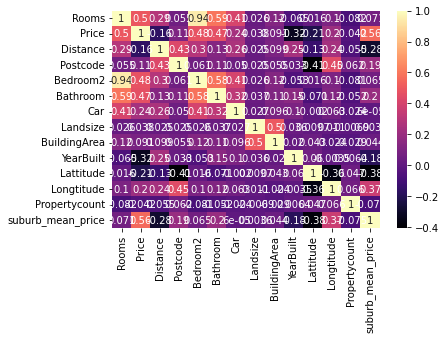

In [10]:
#@title
sb.heatmap(melb_df.corr(), annot = True, cmap = 'magma')
plt.show()

### After removing outliers

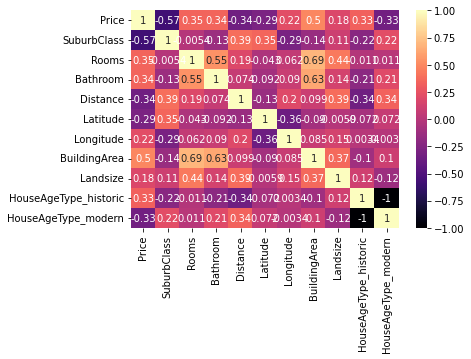

In [11]:
#@title
sb.heatmap(final_df.corr(), annot = True, cmap = 'magma')
plt.show()

## **Correlations between columns**

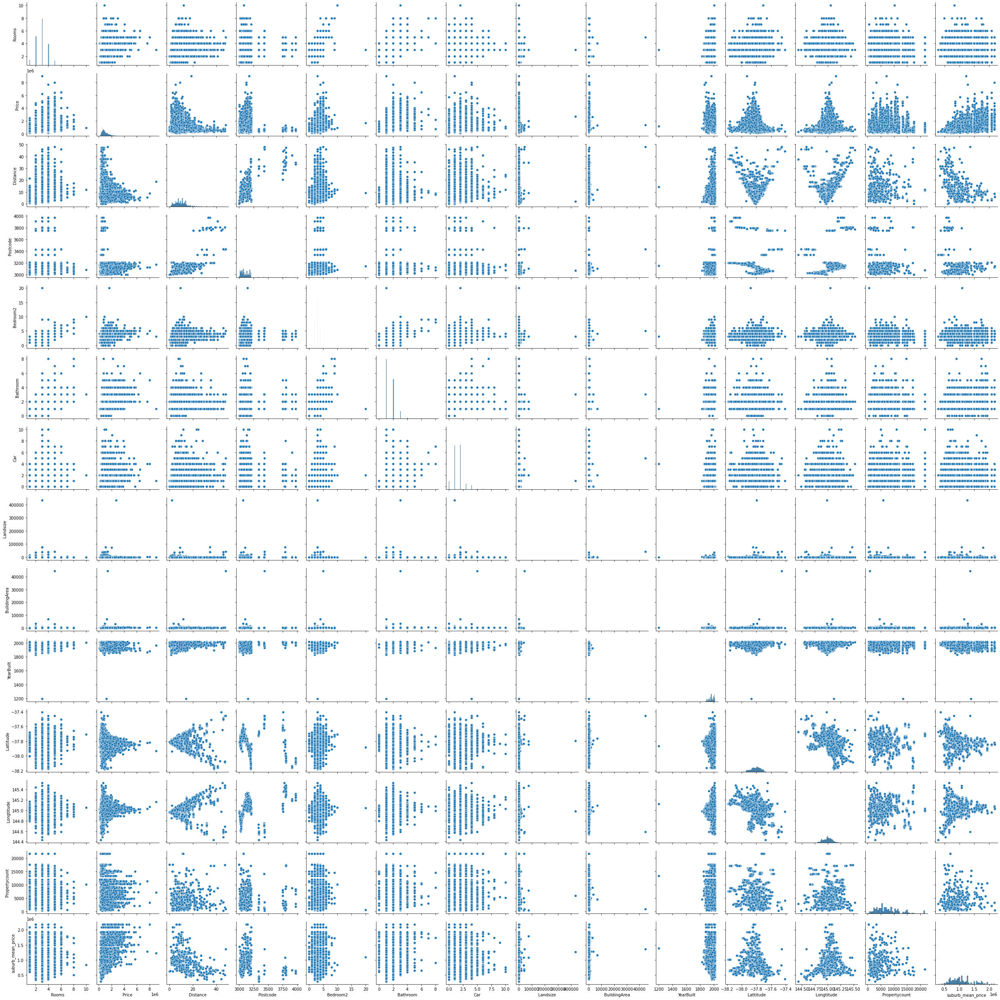

In [12]:
#@title
sb.pairplot(melb_df)

# Heatmap of Melbourne housing market

In [13]:
#@title
# Filter out extreme price outliers for visualization purposes
low_q = final_df['Price'].quantile(0.001)
high_q = final_df['Price'].quantile(0.999)

vis_df = final_df[(final_df['Price'] > low_q) & (final_df['Price'] < high_q)]

fig_hm = px.density_mapbox(vis_df, lat='Latitude', lon='Longitude', z='Price', radius=13,
                        center=dict(lat=-37.8, lon=145), zoom=9.75, height = 600, width = 1000,
                        mapbox_style='streets', title = 'Melbourne Housing - heatmap')
fig_hm.update_layout(mapbox_accesstoken=mapbox_pub_token)

fig_hm.show()
fig_hm.write_html("Heatmap_choropleth.html")

# Average cost for housing by suburbs

In [14]:
#@title
# Data Preparation

# Add new column with mean suburb price
suburb_mean_price = melb_df.groupby('Suburb')['Price'].mean()
suburb_df = suburb_mean_price.reset_index()

# Capitalize all Suburb names like in GeoJSON
suburb_df['Suburb'] = suburb_df['Suburb'].apply(lambda x: x.upper())

f = open('Victoria_suburb_geoJSON.json')
suburbs = json.load(f)

# Only cover melbourne suburbs
suburbs['features'] = [x for x in suburbs['features'] if x['properties']['vic_loca_2'] in suburb_df['Suburb'].unique()]


In [15]:
#@title
# Plot choropleth
fig_suburbs = px.choropleth_mapbox(suburb_df, 
                                   locations='Suburb', 
                                   color='Price', 
                                   center=dict(lat=-37.8, lon=145), 
                                   zoom=9.75,  
                                   height = 600,
                                   width = 1000,
                                   geojson=suburbs, 
                                   featureidkey='properties.vic_loca_2',
                                   title='Mean suburb property prices',
                                   mapbox_style='streets')
fig_suburbs.update_layout(mapbox_accesstoken=mapbox_pub_token)
fig_suburbs.show()

# **Load the model**

In [16]:
# Best run
run_id = 'ed0dd55d46d74016bb86835c04de4acc'

# Load model 
loaded_model = pickle.load(open(f'mlruns/1/{run_id}/artifacts/final_model/model.pkl', 'rb'))

# Alternative funtions to load model
#loaded_model = mlflow.pyfunc.load_model(f"runs:/{run_id}/final_model")
#loaded_model = mlflow.sklearn.load_model(f"runs:/{run_id}/final_model")

# Model Evaluation - Hyperparameter and Feature Tuning over time


In [17]:
#@title
# Data preparation of MLFlow runs
runs_df.index = pd.to_datetime(runs_df.index) 
sorted_runs_df = runs_df.set_index('Start Time', drop=True, append=False, inplace=False, verify_integrity=False)
sorted_runs_df = sorted_runs_df.sort_index()   # Sort by Start Time
sorted_runs_df['mae'] = sorted_runs_df['mae'].apply(lambda x: int(x))  # Round values

# Create subsets of runs_df for phases and filling
sub_runs_df1 = sorted_runs_df['2022-02-23 18:43:41':'2022-03-01 16:47:41']
sub_runs_df2 = sorted_runs_df['2022-03-01 16:47:41':'2022-03-02 14:19:22']
sub_runs_df3 = sorted_runs_df['2022-03-02 14:19:22':'2022-03-05 00:04:30']
sub_runs_df4 = sorted_runs_df['2022-03-05 00:04:30':'2022-03-05 00:24:45']
best_mae = sorted_runs_df.loc['2022-03-05 00:24:45']['mae'] # Last and best metric

# Save as csv with Start Time as index
sorted_runs_df.to_csv('sorted_runs_df.csv', index=True)

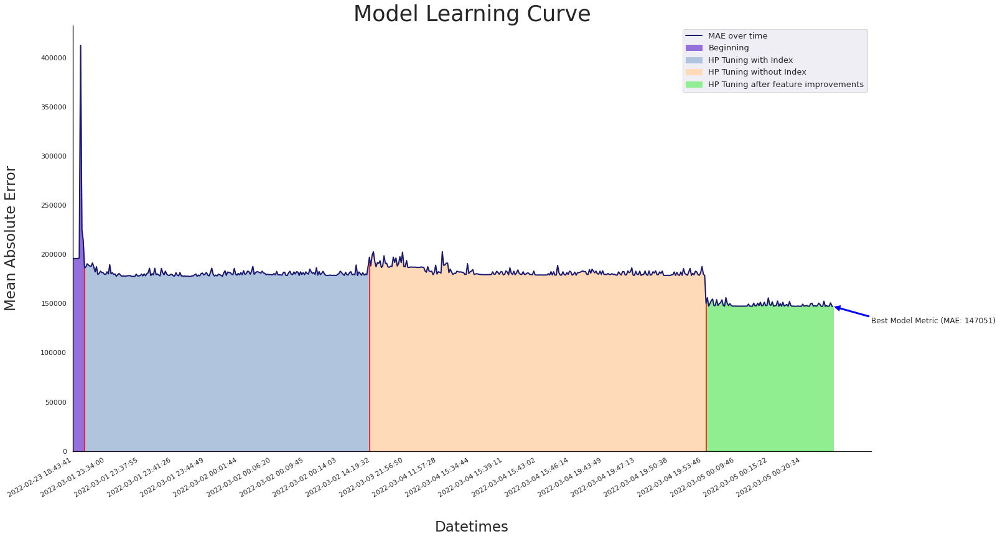

In [28]:
#@title
# Layout pre sets
fig, ax = plt.subplots()
fig.set_size_inches(23, 14)
ax.set_facecolor('white')
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')

# Plot metrics and split them visually into phases
metrics_plot = plt.plot(sorted_runs_df.index, sorted_runs_df['mae'], color='midnightblue', linewidth=2, label='MAE over time')

plt.fill_between(sub_runs_df1.index, sub_runs_df1['mae'], color='mediumpurple', label='Beginning')
vline1 = plt.vlines(sorted_runs_df.loc['2022-03-01 16:47:41'].name, 0, sorted_runs_df.loc['2022-03-01 16:47:41']['mae'], color='red', linewidth=1.5)
plt.fill_between(sub_runs_df2.index, sub_runs_df2['mae'], color='lightsteelblue', label='HP Tuning with Index')
vline2 = plt.vlines(sorted_runs_df.loc['2022-03-02 14:19:22'].name, 0, sorted_runs_df.loc['2022-03-02 14:19:22']['mae'], color='red', linewidth=1.5)
plt.fill_between(sub_runs_df3.index, sub_runs_df3['mae'], color='peachpuff', label='HP Tuning without Index')
vline3 = plt.vlines(sorted_runs_df.loc['2022-03-05 00:04:30'].name, 0, sorted_runs_df.loc['2022-03-05 00:04:30']['mae'], color='red', linewidth=1.5)
plt.fill_between(sub_runs_df4.index, sub_runs_df4['mae'], color='lightgreen', label='HP Tuning after feature improvements')
plt.annotate(f'Best Model Metric (MAE: {best_mae})',
         xy=(sorted_runs_df.loc['2022-03-05 00:24:45'].name, sorted_runs_df.loc['2022-03-05 00:24:45']['mae']), 
         xycoords='data',
         textcoords='axes fraction',
         xytext=(1, 0.3),
         arrowprops=dict(facecolor='blue'))

# Layout refinement
ax.set_ylim(ymin=0)   # Start axis at y = 0
ax.set_xlim(xmin=0)
ax.xaxis.set_major_locator(plt.MaxNLocator(25)) # Reduce displayed x-ticks
fig.autofmt_xdate()   # Format x-ticks for dates
plt.title('Model Learning Curve', fontsize=35)
plt.xlabel('Datetimes', fontsize=23, labelpad=35) 
plt.ylabel('Mean Absolute Error', fontsize=23, labelpad=35) 

# Legend
plt.legend(loc='upper right', fontsize=13)


# Evaluate final model on test data set

In [19]:
# Evlauate model with test data set
y_pred = loaded_model.predict(X_test)
metrics = eval_model(y_test, y_pred)
print(metrics)

{'mae': 156315.03675338638, 'mse': 58356806128.07345, 'rmse': 241571.53418412825, 'r2': 0.8020622310905352}


# Compare feature importance of model

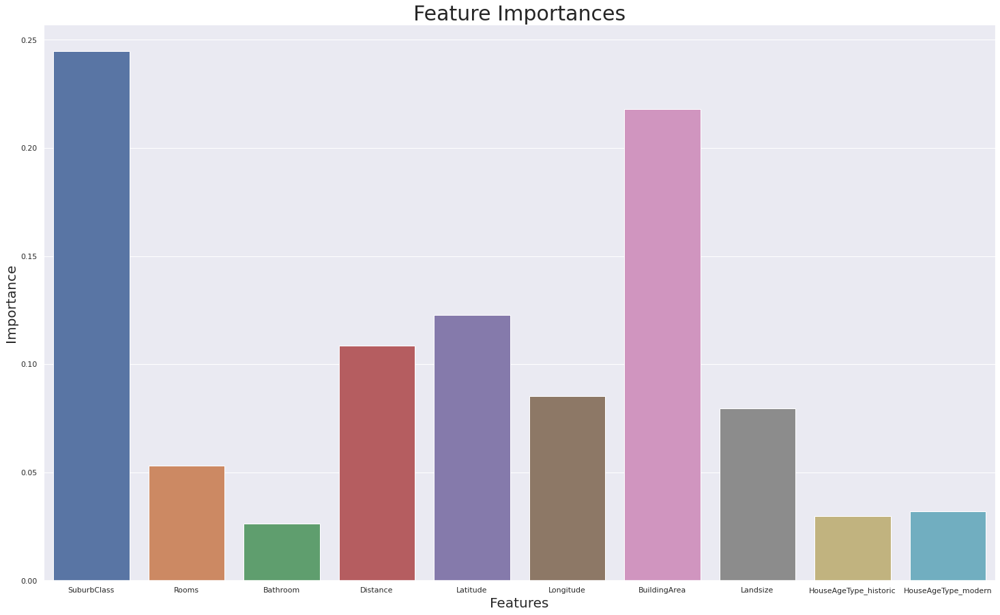

In [20]:
#@title
# Layout pre sets
sb.set_theme(style='whitegrid')
sb.set(rc={'figure.figsize':(25,15)})

# Get feature importance from model
importance = loaded_model.feature_importances_
importances = pd.Series(loaded_model.feature_importances_,index=X_val.columns)

# Plot feature importance bar plot
ax = sb.barplot(x=importances.index, y=importances.values)
ax.axes.set_title('Feature Importances',fontsize=30)
ax.set_xlabel('Features',fontsize=20)
ax.set_ylabel('Importance',fontsize=20)
ax.tick_params(labelsize=11)

# **Demo predictions**

Feel free to adjust the amount of predictions.

In [21]:
#@title
# Function to randomly predict prices with more details
def select_random_pred(n):
  indices = random.sample(range(0, len(X_test)), n)
  tb_predicted = X_test.iloc[indices]
  true_labels = np.take(y_test, indices)
  compared_list = []
  for i in range(0, len(tb_predicted)):
    compared_list.append(calc_prob(tb_predicted.iloc[i]))
  predictions = loaded_model.predict(tb_predicted)
  for e in range(0, len(tb_predicted)):
    print(f'{e+1}. Prediction:')
    print(f'The properties building area lies {abs(compared_list[e][0])}%{check_pos_neg(compared_list[e][0], 0)} the mean.') #{above/below} if minus -> below -> then remove minus
    print(f'Distance to city center was {abs(compared_list[e][1])}km{check_pos_neg(compared_list[e][1], 1)} the average.') #{lower, higher}
    print(f'And lastly the amount of rooms counted to {abs(compared_list[e][2])}{check_pos_neg(compared_list[e][2], 0)} standard.') #{above, below}
    print(f'Predicted price: {round(predictions[e])}$')
    print(f'Actual price: {round(true_labels[e])}$')
    print(f'Mean absolute error: {abs(round(true_labels[e]-predictions[e]))}$\n')

In [22]:
select_random_pred(7)

1. Prediction:
The properties building area lies 26% below the mean.
Distance to city center was 0.9km higher than the average.
And lastly the amount of rooms counted to 0, therefore, same as standard.
Predicted price: 852170$
Actual price: 702000$
Mean absolute error: 150170$

2. Prediction:
The properties building area lies 37% below the mean.
Distance to city center was 3.2km higher than the average.
And lastly the amount of rooms counted to 0, therefore, same as standard.
Predicted price: 584960$
Actual price: 590500$
Mean absolute error: 5540$

3. Prediction:
The properties building area lies 37% below the mean.
Distance to city center was 4.9km lower than the average.
And lastly the amount of rooms counted to 1 below standard.
Predicted price: 795864$
Actual price: 685000$
Mean absolute error: 110864$

4. Prediction:
The properties building area lies 73% above the mean.
Distance to city center was 1.6km lower than the average.
And lastly the amount of rooms counted to 2 above sta

# **Sample Decision Tree**

The following plot display the complexity of a sample decision tree from the random forest model.

For a more detailed view open the *'sample_tree.png'*

In [23]:
#@title
plt.figure(figsize=(200,100))  
tree.plot_tree(loaded_model.estimators_[0], feature_names = X_val.columns,
             filled=True, fontsize=6, rounded = True)
plt.savefig('sample_tree.png')
plt.show()